In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('public.csv')

In [3]:
columns_to_keep = ['Title', 'Publication Year', 'Publication Type', 'Source Title', 'Abstract',
                   'Fields of Study', 'Citing Patents Count', 'Citing Works Count']
df = df[columns_to_keep]
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12550 entries, 0 to 12549
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Title                 12549 non-null  object 
 1   Publication Year      12540 non-null  float64
 2   Publication Type      12550 non-null  object 
 3   Source Title          12550 non-null  object 
 4   Abstract              9600 non-null   object 
 5   Fields of Study       10486 non-null  object 
 6   Citing Patents Count  12550 non-null  int64  
 7   Citing Works Count    12550 non-null  int64  
dtypes: float64(1), int64(2), object(5)
memory usage: 784.5+ KB


In [4]:
df = df.dropna()
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9016 entries, 2 to 12548
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Title                 9016 non-null   object 
 1   Publication Year      9016 non-null   float64
 2   Publication Type      9016 non-null   object 
 3   Source Title          9016 non-null   object 
 4   Abstract              9016 non-null   object 
 5   Fields of Study       9016 non-null   object 
 6   Citing Patents Count  9016 non-null   int64  
 7   Citing Works Count    9016 non-null   int64  
dtypes: float64(1), int64(2), object(5)
memory usage: 633.9+ KB


In [5]:
#df = df[df["Citing Patents Count"] == 0]

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9016 entries, 2 to 12548
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Title                 9016 non-null   object 
 1   Publication Year      9016 non-null   float64
 2   Publication Type      9016 non-null   object 
 3   Source Title          9016 non-null   object 
 4   Abstract              9016 non-null   object 
 5   Fields of Study       9016 non-null   object 
 6   Citing Patents Count  9016 non-null   int64  
 7   Citing Works Count    9016 non-null   int64  
dtypes: float64(1), int64(2), object(5)
memory usage: 633.9+ KB


In [7]:
df["Publication Year"] = df["Publication Year"].values.astype(int)
# Introducing temporal ordering
#df["Publication Year"] = pd.to_datetime(df["Publication Year"])
df = df.sort_values(by="Publication Year")

In [8]:
df = df.drop(df[(df['Abstract'] == 'n/') | (df['Abstract'] == "")].index)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8994 entries, 3670 to 107
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Title                 8994 non-null   object
 1   Publication Year      8994 non-null   int32 
 2   Publication Type      8994 non-null   object
 3   Source Title          8994 non-null   object
 4   Abstract              8994 non-null   object
 5   Fields of Study       8994 non-null   object
 6   Citing Patents Count  8994 non-null   int64 
 7   Citing Works Count    8994 non-null   int64 
dtypes: int32(1), int64(2), object(5)
memory usage: 597.3+ KB


In [10]:
pd.set_option('display.max_rows', df.shape[0]+1)
pd.set_option('display.max_columns',df.shape[1]+1)
pd.set_option('display.width', 1000)
pd.set_option('display.max_colwidth', None)

<AxesSubplot:xlabel='Publication Year'>

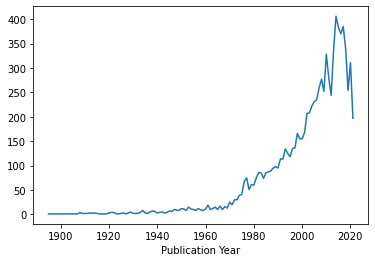

In [11]:
df.groupby('Publication Year').count()['Title'].plot()

<AxesSubplot:xlabel='Publication Year'>

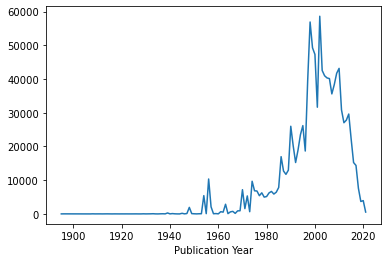

In [12]:
df.groupby('Publication Year').sum()['Citing Works Count'].plot()

In [13]:
import heapq
import re # regular expressions
import nltk
import string
nltk.download('punkt')
nltk.download('stopwords')
stopwords = nltk.corpus.stopwords.words('english')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\carus\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\carus\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [14]:
def preprocess(text):
    formatted_text = text.lower()
    tokens = []
    for token in nltk.word_tokenize(formatted_text):
        tokens.append(token)
    
    #print(tokens)
    tokens = [word for word in tokens if word not in stopwords and word not in string.punctuation]
    formatted_text = ' '.join(element for element in tokens)
    return formatted_text

In [15]:
df["Abstract"] = df["Abstract"].apply(preprocess)

In [16]:
counts = df.groupby('Publication Year').count()['Title'].values
place_holder = [None]*(len(counts)+1)
place_holder[0] = 0
for i in range(1,len(counts)+1):
    place_holder[i] = place_holder[i-1] + counts[i-1]

In [17]:
len(counts)

112

In [18]:
len(df['Publication Year'].unique())

112

In [19]:
df = df.drop(df[(df['Abstract'] == 'n/') | (df['Abstract'] == "")].index)

In [20]:
df[(df['Abstract'] == 'n/') | (df['Abstract'] == "")].index

Int64Index([], dtype='int64')

In [21]:
df['Publication Year'].unique()

array([1895, 1896, 1907, 1908, 1909, 1911, 1912, 1913, 1914, 1916, 1917,
       1919, 1920, 1921, 1922, 1923, 1924, 1926, 1927, 1928, 1929, 1930,
       1932, 1933, 1934, 1935, 1936, 1937, 1938, 1939, 1940, 1941, 1942,
       1943, 1944, 1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953,
       1954, 1955, 1956, 1957, 1958, 1959, 1960, 1961, 1962, 1963, 1964,
       1965, 1966, 1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975,
       1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986,
       1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997,
       1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008,
       2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019,
       2020, 2021])

In [22]:
df['Publication Year'].value_counts() 

2014    406
2017    385
2015    383
2016    370
2018    339
2013    337
2010    328
2020    311
2011    280
2008    277
2007    259
2019    254
2009    252
2012    244
2006    235
2005    231
2004    222
2003    208
2002    207
2021    197
2001    168
1998    166
2000    155
1999    155
1997    136
1996    135
1993    134
1994    125
1995    118
1991    114
1992    113
1989     98
1988     95
1990     95
1987     89
1986     87
1982     86
1985     85
1983     85
1981     75
1977     75
1984     74
1976     67
1979     61
1980     60
1978     51
1975     41
1974     39
1973     30
1972     30
1970     25
1971     20
1961     19
1966     17
1968     16
1953     15
1964     15
1969     13
1963     12
1957     12
1950     12
1960     11
1954     11
1951     11
1955     10
1947     10
1967     10
1965     10
1962     10
1948      9
1958      9
1949      8
1934      8
1959      8
1952      8
1956      8
1938      7
1945      7
1946      6
1939      6
1942      5
1929      5
1937      5
1944

In [23]:
interesting_years = [1908, 1909, 1911, 1912, 1913, 1914, 
       1920, 1921, 1922, 1926, 1928, 1929, 1930,
       1932, 1933, 1934, 1935, 1936, 1937, 1938, 1939, 1940, 1941, 1942,
       1943, 1944, 1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953,
       1954, 1955, 1956, 1957, 1958, 1959, 1960, 1961, 1962, 1963, 1964,
       1965, 1966, 1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975,
       1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986,
       1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997,
       1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008,
       2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019,
       2020, 2021]
interesting_years.sort()

In [24]:
recent_years = [2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008,
               2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020]

In [53]:
df_recent = df[df['Publication Year'].isin(recent_years)]

In [55]:
len(df_recent)

5851

In [ ]:
percentage_high = 0.95
percentage_low = 0.015 # 1% or 1.5% is probably better

In [56]:
# Getting bigrams from abstracts
#vectorizer_abstracts = CountVectorizer(ngram_range =(2, 2), max_df = percentage_high, min_df = percentage_low)
#X_titles = vectorizer_abstracts.fit_transform(df_recent["Abstract"]) 
#features_abstracts = (vectorizer_abstracts.get_feature_names())
#print("\n\nX_titles : \n", X_titles.toarray())

In [58]:
# Applying TFIDF to titles
#You can still get n-grams here
vectorizer_abstracts = TfidfVectorizer(ngram_range = (2, 2), max_df = percentage_high, min_df = percentage_low)
abstracts_tfidf = vectorizer_abstracts.fit_transform(df_recent["Abstract"])
scores = (abstracts_tfidf.toarray())
#print("\n\nScores : \n", scores)

In [62]:
tf_idf_abstracts = pd.DataFrame(data=abstracts_tfidf.toarray(),columns=vectorizer_abstracts.get_feature_names())
tf_idf_abstracts.shape

(5851, 52)

In [63]:
tf_idf_abstracts.columns

Index(['abstract paper', 'abstract study', 'also find', 'data set', 'developing countries', 'economic growth', 'empirical evidence', 'equilibrium model', 'et al', 'field experiment', 'find evidence', 'fiscal policy', 'general equilibrium', 'human capital', 'income tax', 'labor market', 'labor supply', 'less likely', 'long run', 'long term', 'low income', 'monetary policy', 'panel data', 'paper analyzes', 'paper examines', 'paper investigates', 'paper presents', 'paper provides', 'paper studies', 'percentage points', 'private information', 'private sector', 'public debt', 'public good', 'public goods', 'public information', 'public policy', 'public private', 'public sector', 'public spending', 'results indicate', 'results show', 'results suggest', 'rights reserved', 'short run', 'short term', 'social security', 'social welfare', 'tax rate', 'tax rates', 'united states', 'using data'], dtype='object')



Most relevant bi-grams 
                     term        rank
0         abstract paper  322.388293
34          public goods  205.009014
50         united states  182.691099
33           public good  165.448179
10         find evidence  141.613221
42       results suggest  136.746585
18              long run  135.028845
51            using data  131.612701
24        paper examines  128.930624
28         paper studies  126.717477
15          labor market  125.782262
49             tax rates  118.320129
13         human capital  115.150770
19             long term  113.935155
30   private information  106.817504
6     empirical evidence  101.262600
38         public sector  100.682836
2              also find   96.538069
41          results show   95.862650
22            panel data   95.841519
5        economic growth   94.838492
1         abstract study   94.658881
48              tax rate   91.932979
32           public debt   91.832826
36         public policy   90.220137
23        p

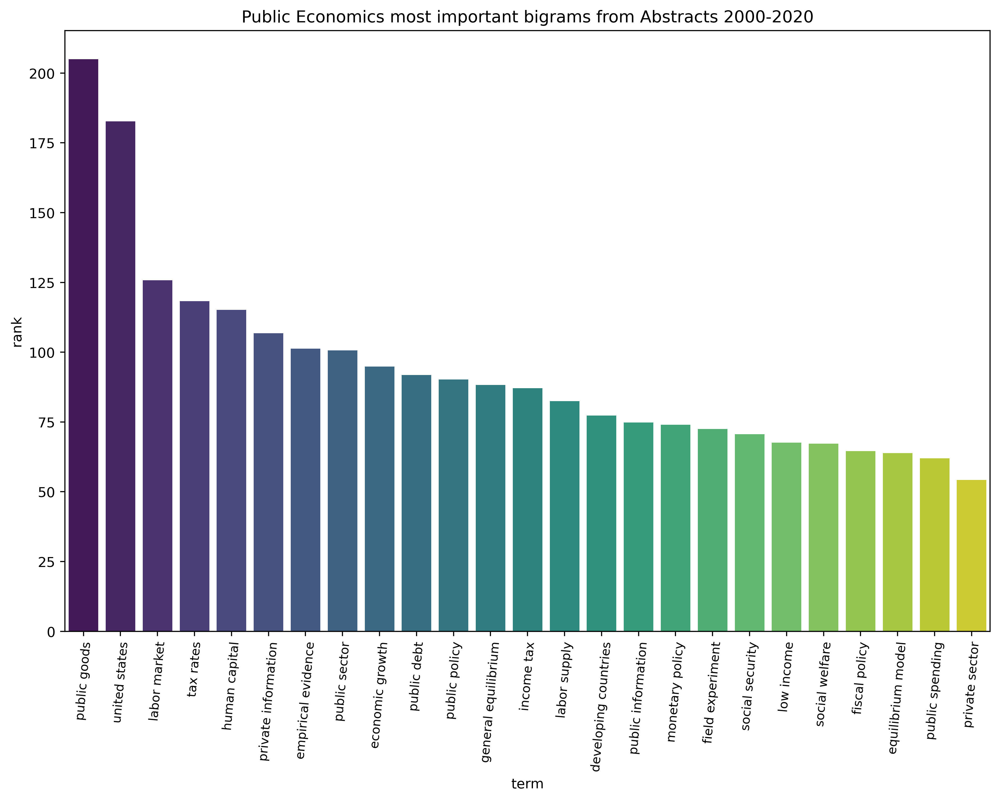

In [64]:
 # Getting top ranking features
sums = abstracts_tfidf.sum(axis = 0)
data1 = []
for col, term in enumerate(features_abstracts):
    data1.append((term, sums[0, col]))
ranking = pd.DataFrame(data1, columns = ['term', 'rank'])
words = (ranking.sort_values('rank', ascending = False))
print("\n\nMost relevant bi-grams \n", words.head(50))
plt.figure(figsize=(12,8), dpi=400)
sns.barplot(x="term", y="rank", data=ranking.loc[ranking['term'].isin(['developing countries', 'economic growth', 
'empirical evidence','equilibrium model', 'field experiment', 'fiscal policy', 
'general equilibrium', 'human capital', 'income tax', 'labor market', 'labor supply','low income', 'monetary policy', 
'private information', 'private sector', 'public debt', 'public goods', 'public information', 'public policy', 'public sector',
'public spending', 'social security', 'social welfare', 'tax rates', 'united states'])].sort_values('rank', ascending = False), palette = 'viridis')
plt.title("Public Economics most important bigrams from Abstracts 2000-2020")
plt.xticks(fontsize=9, rotation=85);
plt.yticks(fontsize=10);

In [25]:
len(interesting_years)

103

In [26]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
import scipy.sparse as sparse
import networkx as nx

In [27]:
percentage_high = 0.95
percentage_low = 0.015 # 1% or 1.5% is probably better

In [28]:
# Getting bigrams from abstracts
#vectorizer_abstracts = CountVectorizer(ngram_range =(2, 2), max_df = percentage_high, min_df = percentage_low)
#X_titles = vectorizer_abstracts.fit_transform(df["Abstract"]) 
#features_abstracts = (vectorizer_abstracts.get_feature_names())
#print("\n\nX_titles : \n", X_titles.toarray())

In [29]:
# Applying TFIDF to titles
#You can still get n-grams here
vectorizer_abstracts = TfidfVectorizer(ngram_range = (2, 2), max_df = percentage_high, min_df = percentage_low)
abstracts_tfidf = vectorizer_abstracts.fit_transform(df["Abstract"])
scores = (abstracts_tfidf.toarray())
#print("\n\nScores : \n", scores)



Most relevant bi-grams 
                     term        rank
0         abstract paper  612.105411
33          public goods  367.270779
45         united states  341.614551
32           public good  291.785438
22        paper examines  224.558312
16              long run  209.456766
12            income tax  203.427587
34         public policy  195.224873
44             tax rates  194.900782
36         public sector  193.453778
39       results suggest  180.176596
46            using data  173.704241
26         paper studies  173.185406
8          find evidence  166.145236
27   private information  161.841568
14          labor market  161.661211
43              tax rate  161.044295
17             long term  159.470245
11         human capital  158.590782
10   general equilibrium  158.495154
35        public private  151.905968
6     empirical evidence  144.837367
31           public debt  138.096000
20        paper analyzes  133.446030
5        economic growth  132.835837
23    paper

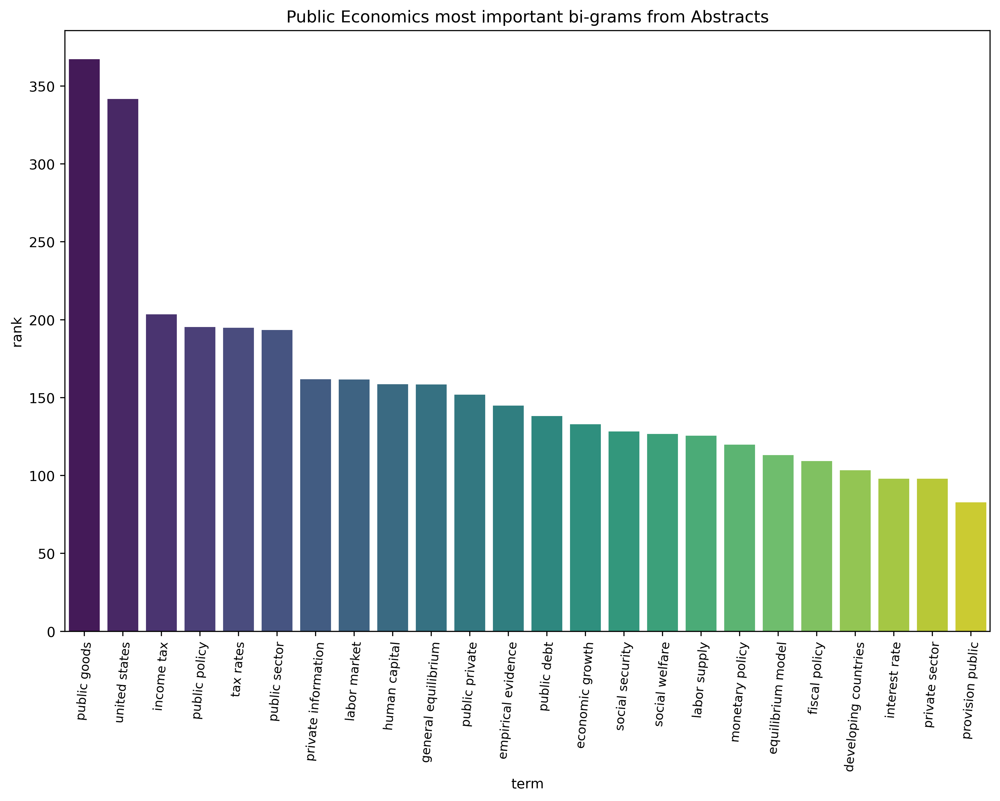

In [30]:
 # Getting top ranking features
sums = abstracts_tfidf.sum(axis = 0)
data1 = []
for col, term in enumerate(features_abstracts):
    data1.append((term, sums[0, col]))
ranking = pd.DataFrame(data1, columns = ['term', 'rank'])
words = (ranking.sort_values('rank', ascending = False))
print("\n\nMost relevant bi-grams \n", words.head(50))
plt.figure(figsize=(12,8), dpi=400)
sns.barplot(x="term", y="rank", data=ranking.loc[ranking['term'].isin(['developing countries', 'economic growth', 'empirical evidence',
       'equilibrium model', 'fiscal policy',
       'general equilibrium', 'human capital', 'income tax',
       'interest rate', 'labor market', 'labor supply','monetary policy',
       'private information', 'private sector',
       'provision public', 'public debt','public goods',
       'public policy', 'public private', 'public sector',
       'social security', 'social welfare','tax rates','united states'])].sort_values('rank', ascending = False), palette = 'viridis')
plt.title("Public Economics most important bi-grams from Abstracts")
plt.xticks(fontsize=9, rotation=85);
plt.yticks(fontsize=10);

In [31]:
ranking['term'].unique()

array(['abstract paper', 'abstract study', 'also find', 'data set',
       'developing countries', 'economic growth', 'empirical evidence',
       'equilibrium model', 'find evidence', 'fiscal policy',
       'general equilibrium', 'human capital', 'income tax',
       'interest rate', 'labor market', 'labor supply', 'long run',
       'long term', 'monetary policy', 'panel data', 'paper analyzes',
       'paper develops', 'paper examines', 'paper investigates',
       'paper presents', 'paper provides', 'paper studies',
       'private information', 'private public', 'private sector',
       'provision public', 'public debt', 'public good', 'public goods',
       'public policy', 'public private', 'public sector',
       'results indicate', 'results show', 'results suggest', 'short run',
       'social security', 'social welfare', 'tax rate', 'tax rates',
       'united states', 'using data'], dtype=object)

In [32]:
ranking.loc[ranking['term'].isin(['developing countries', 'economic growth', 'empirical evidence',
       'equilibrium model', 'fiscal policy',
       'general equilibrium', 'human capital', 'income tax',
       'interest rate', 'labor market', 'labor supply','monetary policy',
       'private information', 'private sector',
       'provision public', 'public debt','public goods',
       'public policy', 'public private', 'public sector',
       'social security', 'social welfare','tax rates','united states'])].sort_values('rank', ascending = False)

,term,rank
33,public goods,367.270779
45,united states,341.614551
12,income tax,203.427587
34,public policy,195.224873
44,tax rates,194.900782
36,public sector,193.453778
27,private information,161.841568
14,labor market,161.661211
11,human capital,158.590782
10,general equilibrium,158.495154


In [33]:
#tf_idf_abstracts = pd.DataFrame.sparse.from_spmatrix(abstracts_tfidf, columns=vectorizer_abstracts.get_feature_names())
tf_idf_abstracts = pd.DataFrame(data=abstracts_tfidf.toarray(),columns=vectorizer_abstracts.get_feature_names())
tf_idf_abstracts.shape

(8994, 47)

In [34]:
tf_idf_abstracts.columns

Index(['abstract paper', 'abstract study', 'also find', 'data set', 'developing countries', 'economic growth', 'empirical evidence', 'equilibrium model', 'find evidence', 'fiscal policy', 'general equilibrium', 'human capital', 'income tax', 'interest rate', 'labor market', 'labor supply', 'long run', 'long term', 'monetary policy', 'panel data', 'paper analyzes', 'paper develops', 'paper examines', 'paper investigates', 'paper presents', 'paper provides', 'paper studies', 'private information', 'private public', 'private sector', 'provision public', 'public debt', 'public good', 'public goods', 'public policy', 'public private', 'public sector', 'results indicate', 'results show', 'results suggest', 'short run', 'social security', 'social welfare', 'tax rate', 'tax rates', 'united states', 'using data'], dtype='object')

In [35]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_X = scaler.fit_transform(tf_idf_abstracts)

In [36]:
from sklearn.decomposition import PCA

In [37]:
explained_variance = []

for n in range(1,tf_idf_abstracts.shape[1]+1):
    pca = PCA(n_components=n)
    pca.fit(scaled_X)
    explained_variance.append(np.sum(pca.explained_variance_ratio_))

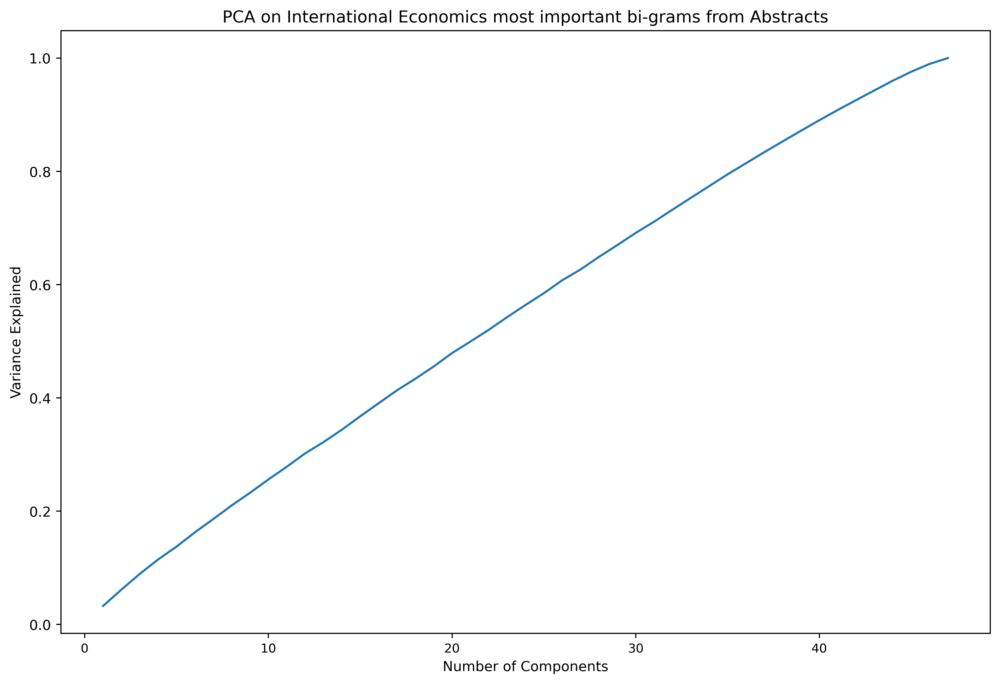

In [38]:
plt.figure(figsize=(12,8), dpi=400)
plt.plot(range(1,tf_idf_abstracts.shape[1]+1),explained_variance)
plt.title("PCA on International Economics most important bi-grams from Abstracts")
plt.xticks(fontsize=9);
plt.yticks(fontsize=10);
plt.xlabel("Number of Components")
plt.ylabel("Variance Explained");

In [39]:
interesting_columns = ['developing countries', 'economic growth', 'empirical evidence',
       'equilibrium model', 'fiscal policy',
       'general equilibrium', 'human capital', 'income tax',
       'interest rate', 'labor market', 'labor supply','monetary policy',
       'private information', 'private sector',
       'provision public', 'public debt','public goods',
       'public policy', 'public private', 'public sector',
       'social security', 'social welfare','tax rates','united states']

In [40]:
tf_idf_abstracts = tf_idf_abstracts[interesting_columns]
tf_idf_abstracts.shape

(8994, 24)

{'1': Text(-0.30798764851285637, -0.7980597686550737, '1'),
 '2': Text(0.7139660074535551, 0.7261529669645955, '2'),
 '3': Text(0.06456671038211584, 0.4249370561566051, '3'),
 '4': Text(0.2627292405079681, 0.4659186579025845, '4'),
 '5': Text(-0.1790567446538585, 0.5198923820463558, '5'),
 '6': Text(-0.6220408625781572, 0.7790286669033736, '6'),
 '7': Text(-0.3636027896199229, 0.04918708267195004, '7'),
 '8': Text(-0.6770856281226103, 0.21065722246885155, '8'),
 '9': Text(-0.16341082278822316, 0.036767307839640814, '9'),
 '10': Text(0.6985573939721875, -0.3164905023084335, '10'),
 '11': Text(0.4286310223436621, 0.3137031186229597, '11'),
 '12': Text(0.5100195982086796, -0.01778938435939518, '12'),
 '13': Text(0.08057391416666651, -0.03240306998753949, '13'),
 '14': Text(-0.5780361668907371, 0.31758639098227837, '14'),
 '15': Text(-0.19228340045516618, 0.15040335180680078, '15'),
 '16': Text(0.4017162855581692, -0.2940552511032732, '16'),
 '17': Text(-0.137177419671355, -0.1530455948689

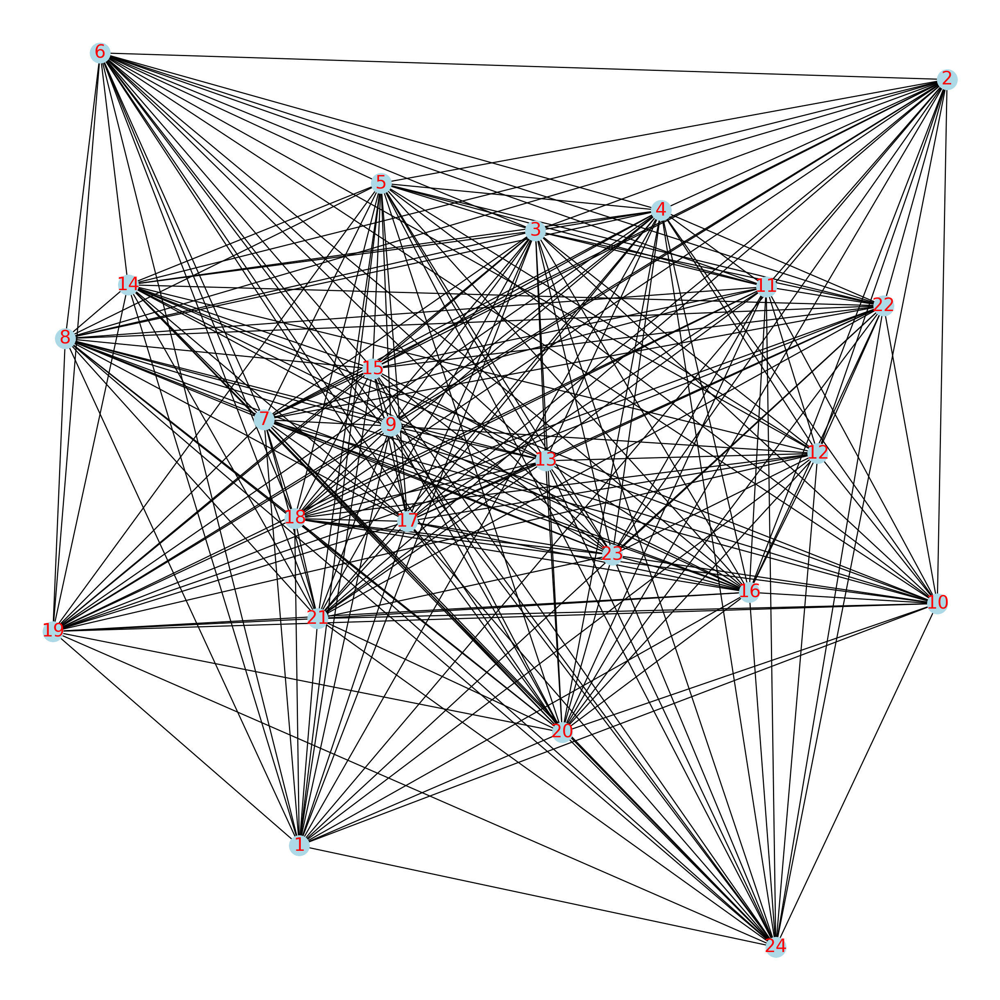

In [41]:
tf_idf_abstracts_2 = tf_idf_abstracts.rename({'developing countries':'1', 'economic growth':'2', 'empirical evidence':'3',
       'equilibrium model':'4', 'fiscal policy':'5',
       'general equilibrium':'6', 'human capital':'7', 'income tax':'8',
       'interest rate':'9', 'labor market':'10', 'labor supply':'11','monetary policy':'12',
       'private information':'13', 'private sector':'14',
       'provision public':'15', 'public debt':'16','public goods':'17',
       'public policy':'18', 'public private':'19', 'public sector':'20',
       'social security':'21', 'social welfare':'22','tax rates':'23','united states':'24'}, axis='columns')
meta_matrix = tf_idf_abstracts_2.transpose().dot(tf_idf_abstracts_2)
G=nx.from_pandas_adjacency(meta_matrix)
plt.figure(figsize=(12,12), dpi=200)
nx.draw(G, pos=nx.kamada_kawai_layout(G), node_color='lightblue')
#nx.draw_networkx_nodes(G, pos=nx.kamada_kawai_layout(G), node_color="tab:red")
nx.draw_networkx_labels(G, pos=nx.kamada_kawai_layout(G), font_size=16, font_color="red")

In [42]:
centrality_time_series = []
count = 0 

# andare di anno in anno
for i in range(0, len(place_holder)-1):
    if(place_holder[i+1]-place_holder[i] > 1):
        count += 1
        meta_matrix = tf_idf_abstracts.iloc[place_holder[i]:place_holder[i+1]+1,:].transpose().dot(tf_idf_abstracts.iloc[place_holder[i]:place_holder[i+1]+1,:])
        G=nx.from_pandas_adjacency(meta_matrix)
        centrality_time_series = centrality_time_series + list(nx.degree_centrality(G).values())
        #clustering_time_series = clustering_time_series + list(nx.clustering(G).values())

In [43]:
count

103

In [44]:
centrality_time_series = np.reshape(centrality_time_series,(count,tf_idf_abstracts.shape[1]))
df_centrality_time_series = pd.DataFrame(data=centrality_time_series, columns=interesting_columns)
df_centrality_time_series['year'] = ""
df_centrality_time_series['year'] = interesting_years
#df_centrality_time_series.to_csv('centrality_time_series_abstracts_bigrams_international.csv')

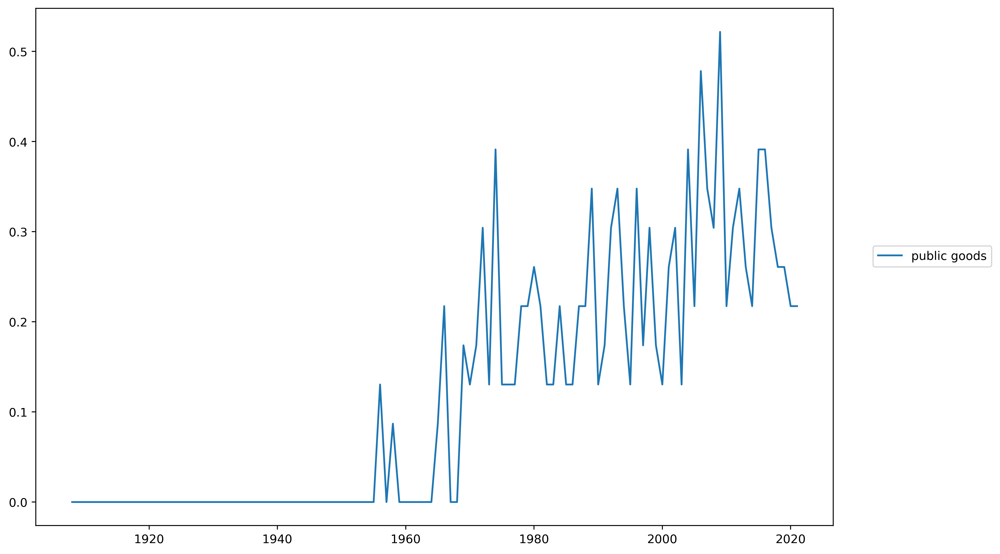

In [45]:
plt.figure(figsize=(12,8), dpi=400)
plt.plot(df_centrality_time_series['year'],df_centrality_time_series['public goods'], label = "public goods")
plt.legend(loc=(1.05,0.5))

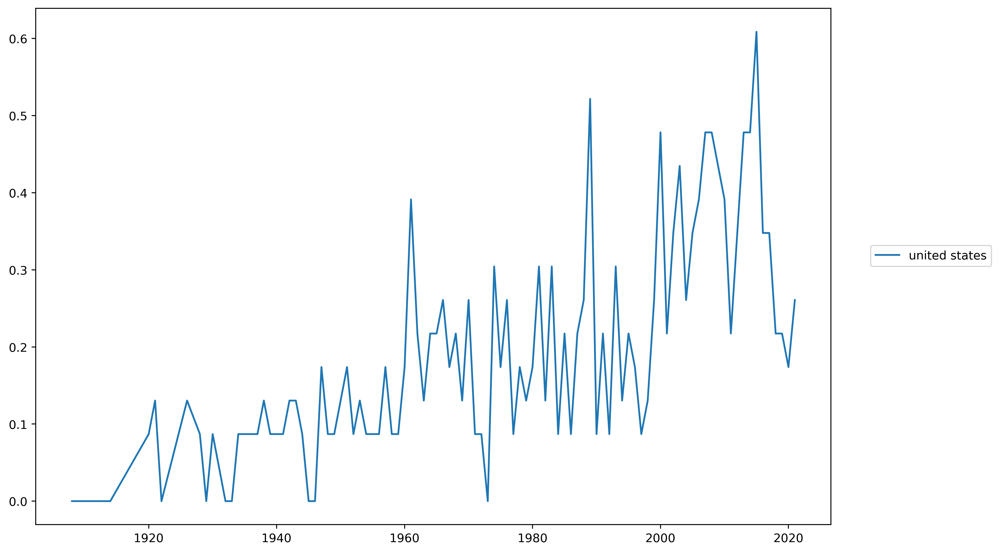

In [46]:
plt.figure(figsize=(12,8), dpi=400)
plt.plot(df_centrality_time_series['year'],df_centrality_time_series['united states'], label = "united states")
plt.legend(loc=(1.05,0.5))

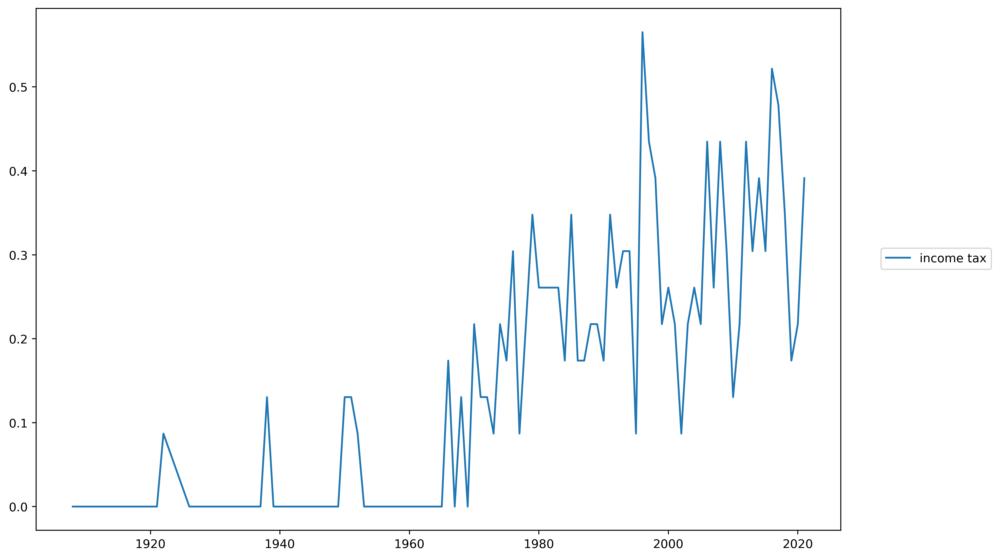

In [47]:
plt.figure(figsize=(12,8), dpi=400)
plt.plot(df_centrality_time_series['year'],df_centrality_time_series['income tax'], label = "income tax")
plt.legend(loc=(1.05,0.5))

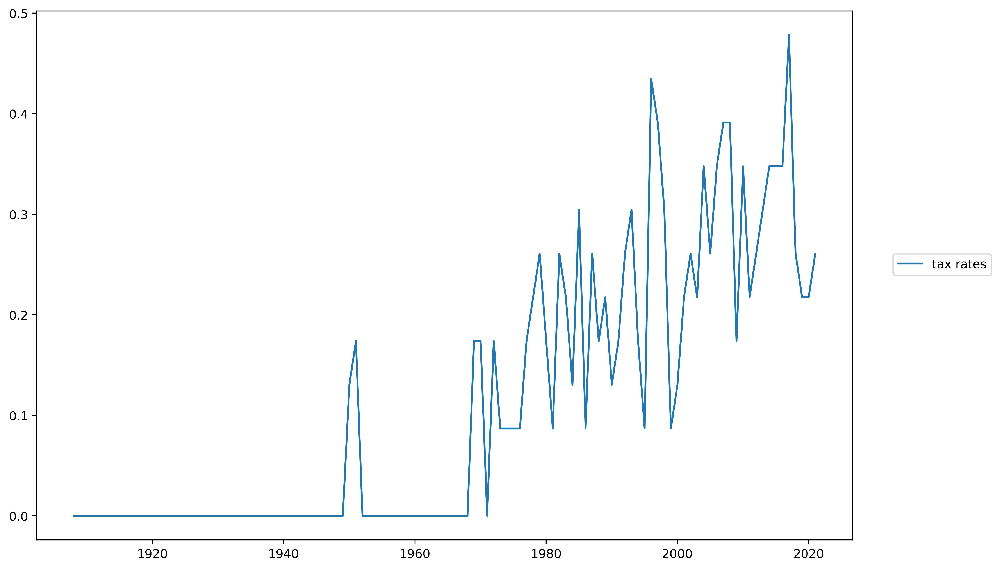

In [48]:
plt.figure(figsize=(12,8), dpi=400)
plt.plot(df_centrality_time_series['year'],df_centrality_time_series['tax rates'], label = "tax rates")
plt.legend(loc=(1.05,0.5))

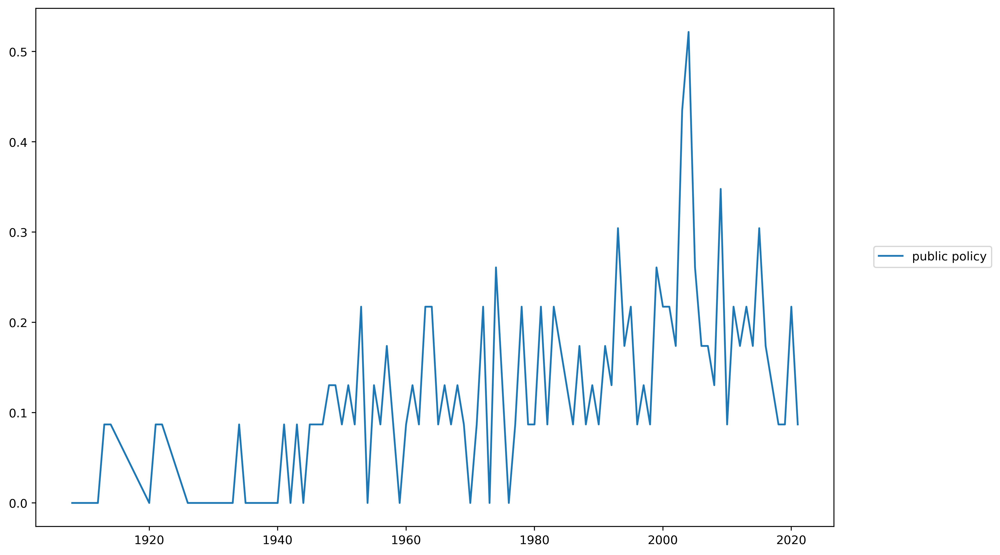

In [49]:
plt.figure(figsize=(12,8), dpi=400)
plt.plot(df_centrality_time_series['year'],df_centrality_time_series['public policy'], label = "public policy")
plt.legend(loc=(1.05,0.5))

In [50]:
df.to_csv('public_cleaned.csv')

In [51]:
df_centrality_time_series.columns

Index(['developing countries', 'economic growth', 'empirical evidence', 'equilibrium model', 'fiscal policy', 'general equilibrium', 'human capital', 'income tax', 'interest rate', 'labor market', 'labor supply', 'monetary policy', 'private information', 'private sector', 'provision public', 'public debt', 'public goods', 'public policy', 'public private', 'public sector', 'social security', 'social welfare', 'tax rates', 'united states', 'year'], dtype='object')

<ipython-input-52-a24d40afe3e2>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12,8), dpi=400)


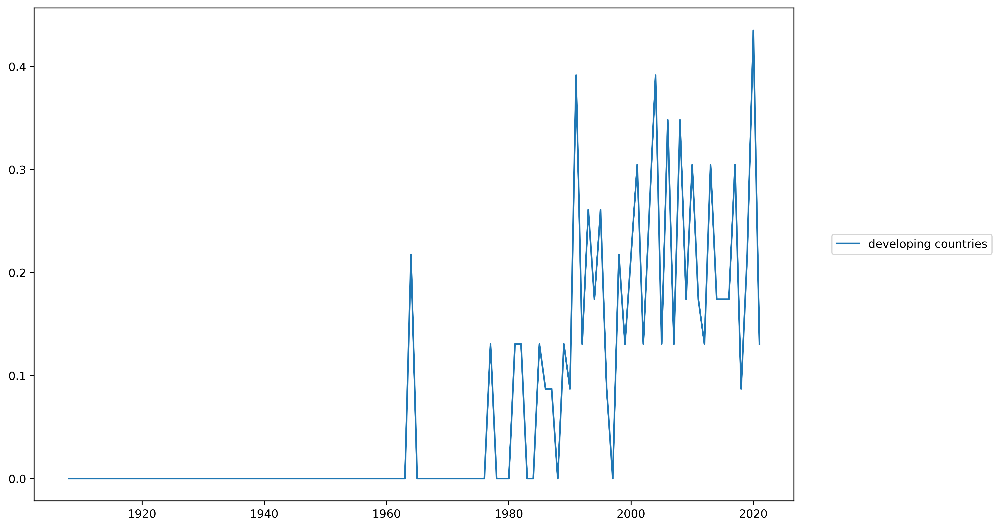

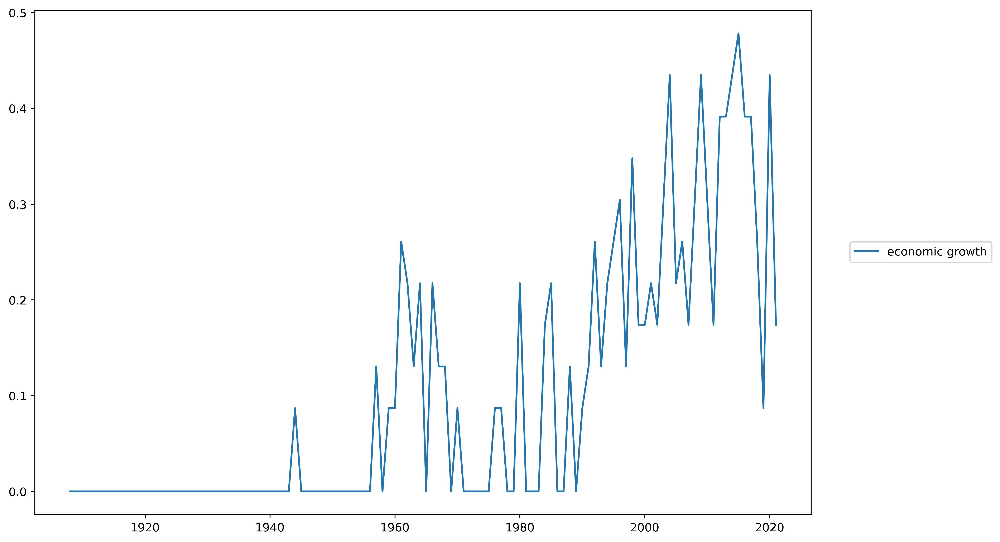

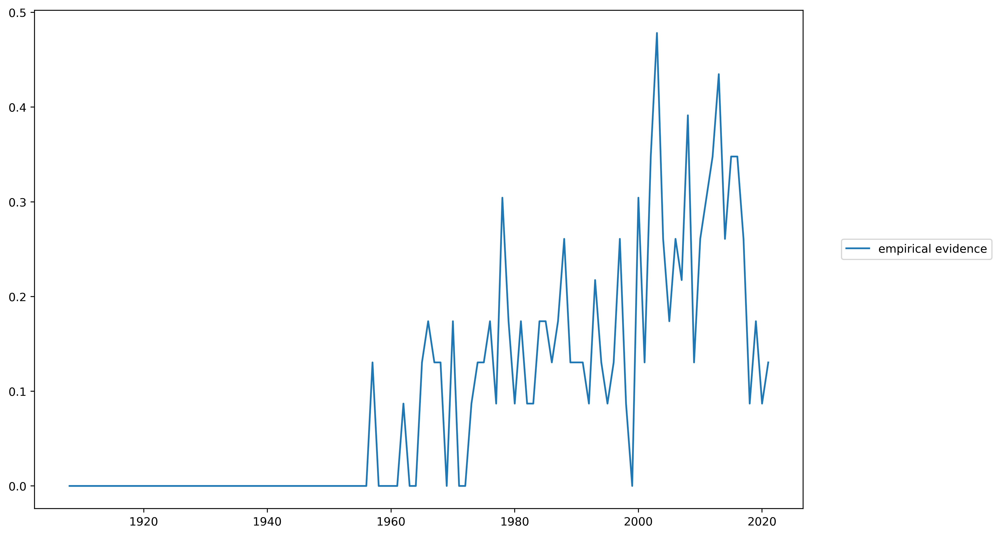

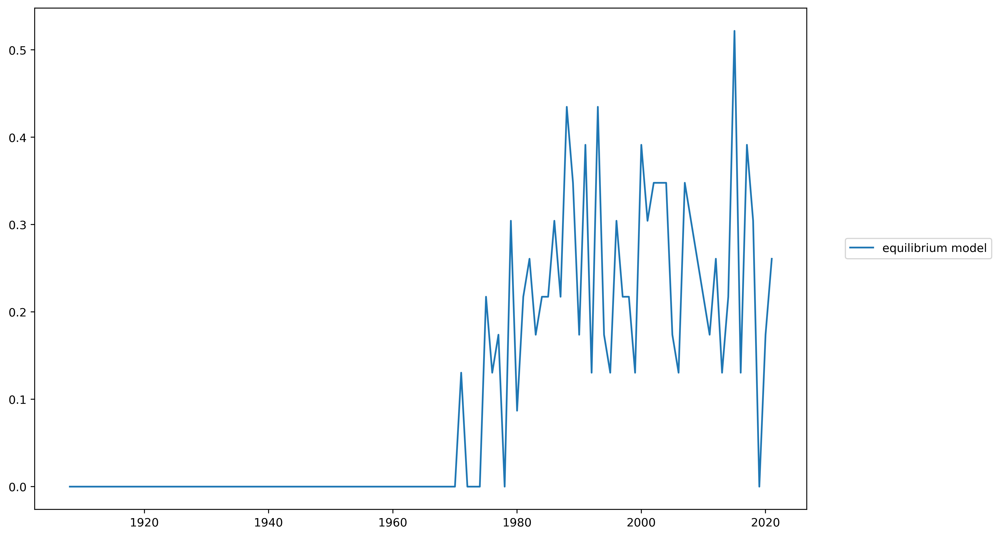

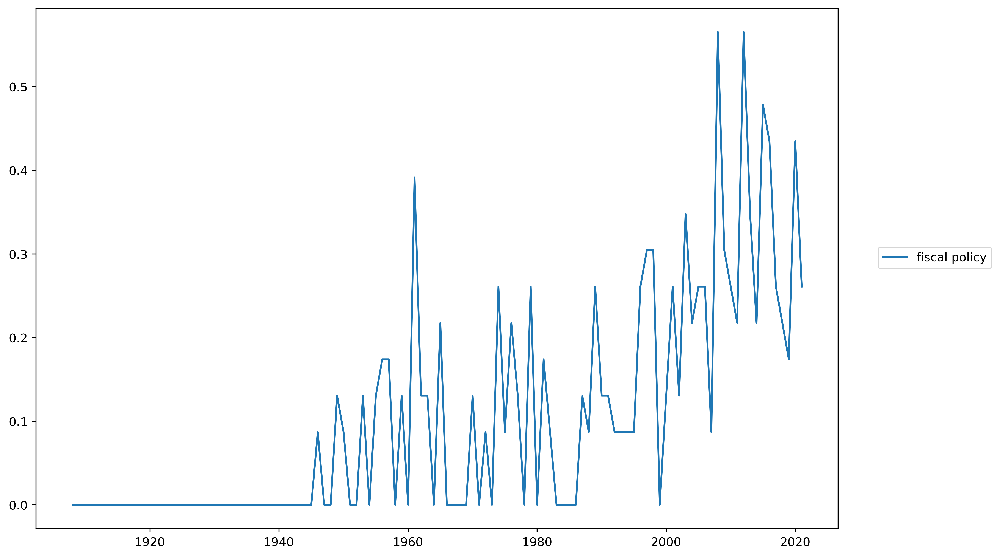

...

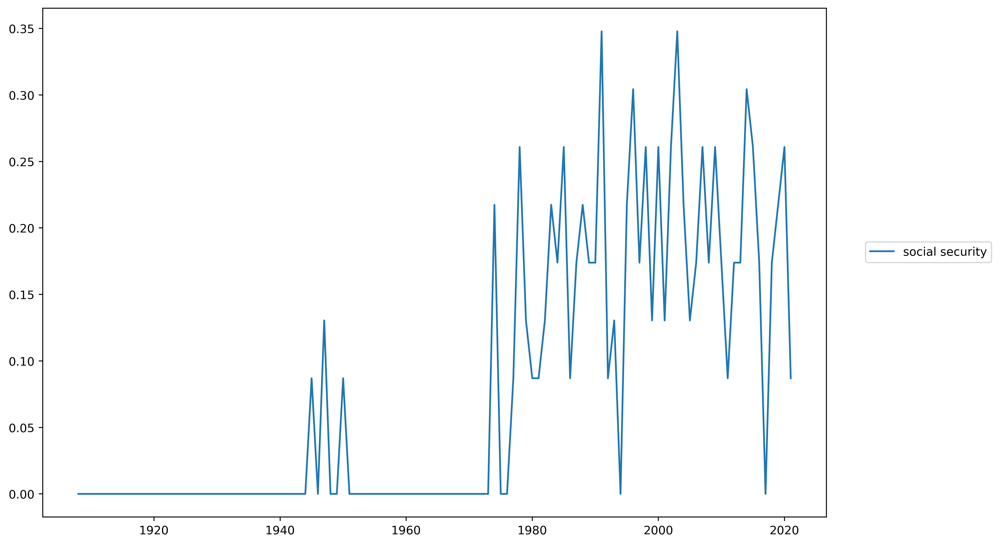

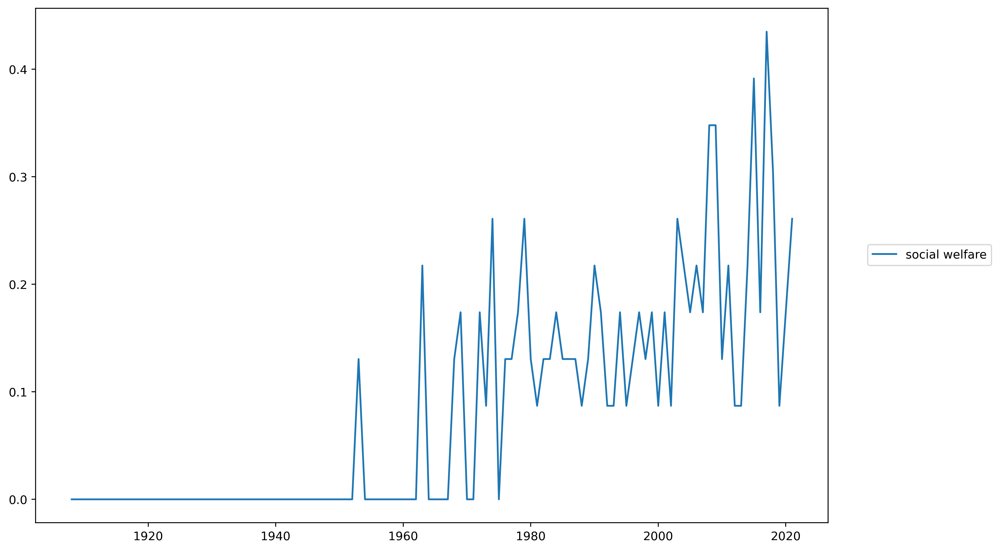

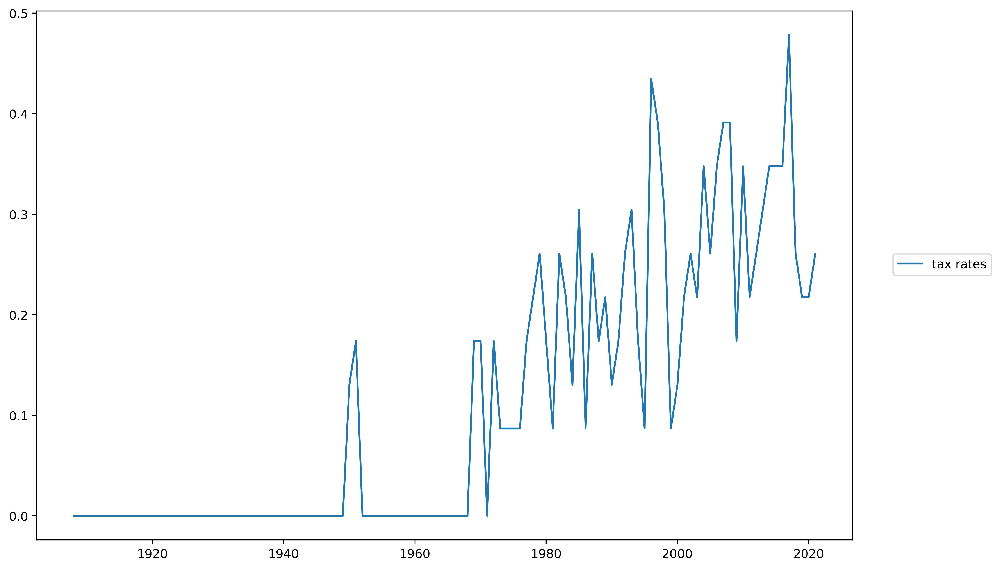

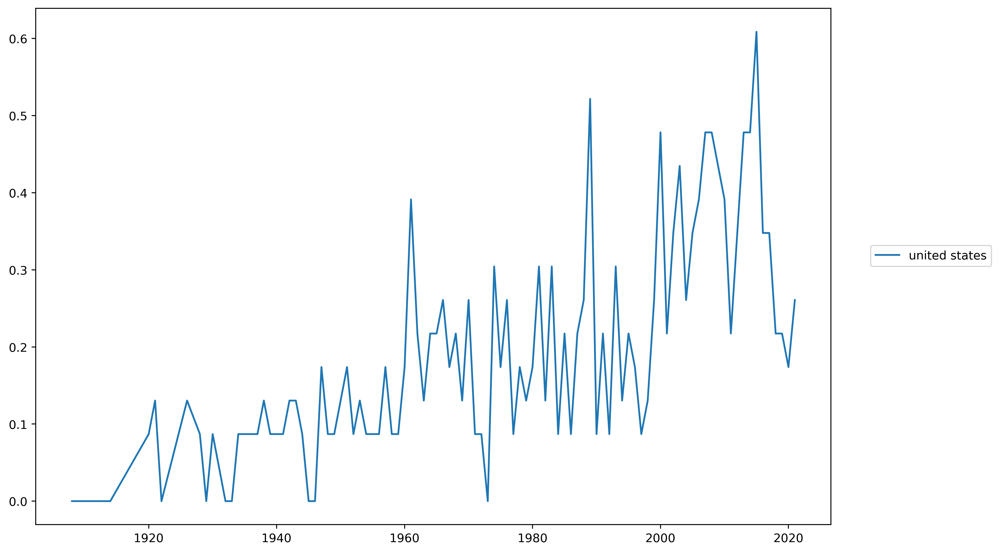

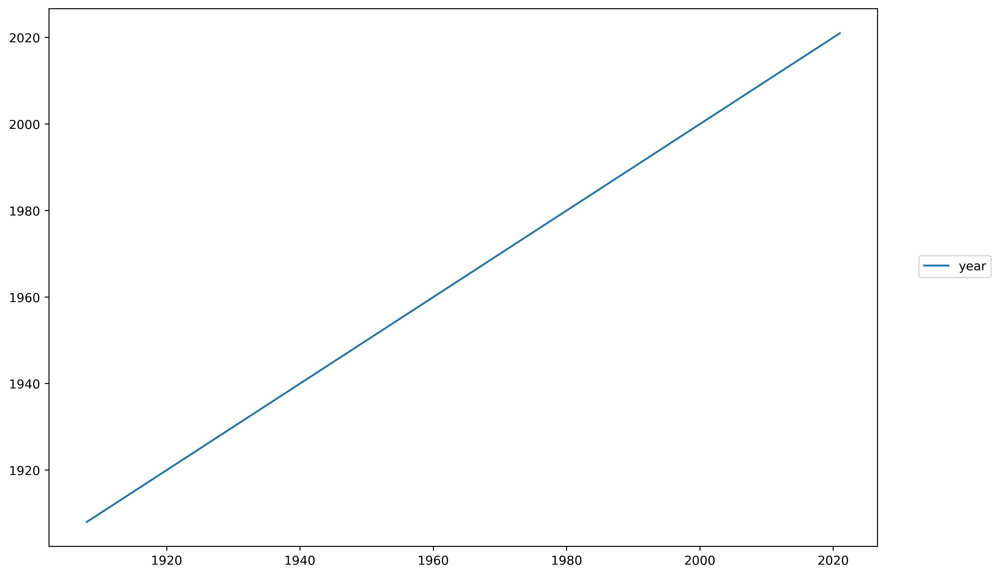

In [52]:
for feature in df_centrality_time_series:
    plt.figure(figsize=(12,8), dpi=400)
    plt.plot(df_centrality_time_series['year'],df_centrality_time_series[feature], label = feature)
    plt.legend(loc=(1.05,0.5))